# **Simplified Object Detection**


<img src="https://miro.medium.com/v2/resize:fit:1400/1*hrXwIJgw51P6p1xJh_IK-g.png" alt="1" border="0">


# **Task Description**

You are required to **create and train a custom object detection model** to solve a simplified object detection task. Additionally, you will implement the same task using a **pre-trained YOLO model**.  

To achieve this, you will first **generate a synthetic dataset** by placing a specific object onto a set of background images. This dataset will be used for training both models. Since this is a **simplified object detection problem**, each image should contain **only a single object**, ensuring a controlled training environment.  

Your goal is to **train a custom object detection model from scratch** and later **fine-tune a pre-trained YOLO model** using the same dataset.

## **Expectations**

- While **high performance is not expected**, your model should **perform better than random guessing**, and the **loss should consistently decrease across epochs**.  

- You should structure your dataset using the **YOLO format for bounding box regression** (`<class_id> <x_center> <y_center> <width> <height>`), where:

  - `<class_id>` is the object class label (an integer starting from 0).
  - `<x_center>` and `<y_center>` are the normalized coordinates (values between 0 and 1) of the bounding box center.
  - `<width>` and `<height>` are the normalized dimensions (values between 0 and 1) of the bounding box relative to the image size.

ensuring that the same dataset can be seamlessly used for fine-tuning a **pre-trained YOLO model**.

- Your evaluation should include key metrics such as **precision, recall, F1-score, mAP (mean average precision), and IoU (Intersection over Union)**, along with monitoring the overall loss trends throughout training. These metrics should be **visualized using plots and graphs** (e.g., with **matplotlib** or **seaborn**) to illustrate performance over time.  

- To prevent overfitting, you should implement techniques such as **Early Stopping** and ensure that the **best-performing model is saved** during training.  

  
## **Requirements**

You will be required to choose at least three different objects that you would like to run object detection on. For the background images, you are free to use anything thematic and download images utilizing a web crawler. A simple example could be `Waldo`, `Wilma`, and `Wenda`, with the background images being *Where’s Waldo?* doodles.

- Data Visualization:
  - Display **your chosen objects with the background removed**.
  - Display **a few of your background images**.
  - Visualize the **synthetic dataset**, where each image should contain a background with an object placed onto it, along with a bounding box and class label.

- Performance Monitoring:
  - **Visualize training and validation losses** (classification loss, regression loss) after training the network.
  - Use **plots and metrics** (e.g., matplotlib, seaborn) to display performance trends.

- Implement overfitting prevention techniques, such as:
  - **Early stopping**
  - **Regularization techniques** (e.g., dropout, weight decay)
  - **Experimenting with different loss functions**
  - Save the **best-performing model** during training.

- Evaluate model performance:
  - **Visualize predictions** on a batch of test images.
  - Calculate **precision, recall, F1-score, mAP, and IoU** for the test dataset.

- Fine-Tuning YOLO:
  - Fine-tune a **YOLO nano** model (**version 5 or later**) on your object detection task.
  - Evaluate model performance using the **same metrics** as before.


> **NOTE:** A **multi-shot object detector is unnecessary** since you are dealing with **single-object detection**, for which a simple bounding box regression and classification head will suffice. Implementing `Non-Maximum Suppression` is also **not required** due to the single-object constraint. If you’re feeling adventurous, you could extend this homework to multi-object detection using a single-shot approach for a **+1 improvement to your grade**!

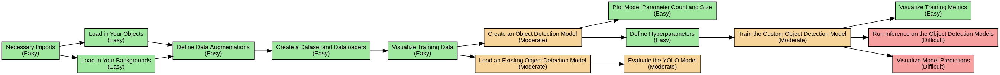

In [ ]:
# @title Custom Object Detection Tasks
# %%capture flowchart_output
# HIDDEN CELL
from graphviz import Digraph
from IPython.display import Image as IMG

def create_flowchart(output_filename='flowchart'):
    dot = Digraph(name='Simplified Object Detection', format='png')
    dot.attr(rankdir='LR')
    dot.attr('node', shape='box', style='filled', fontsize='12', fontname='Arial')

    dot.node('Imports', 'Necessary Imports\n(Easy)', fillcolor='#A0E7A0')

    dot.node('LoadObjects', 'Load in Your Objects\n(Easy)', fillcolor='#A0E7A0')
    dot.node('LoadBackgrounds', 'Load in Your Backgrounds\n(Easy)', fillcolor='#A0E7A0')

    dot.node('AugmentData', 'Define Data Augmentations\n(Easy)', fillcolor='#A0E7A0')
    dot.node('DatasetDataloader', 'Create a Dataset and Dataloaders\n(Easy)', fillcolor='#A0E7A0')

    dot.node('VisualizeSample', 'Visualize Training Data\n(Easy)', fillcolor='#A0E7A0')

    dot.node('CreateModel', 'Create an Object Detection Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('TorchSummary', 'Plot Model Parameter Count and Size\n(Easy)', fillcolor='#A0E7A0')
    dot.node('Hyperparameters', 'Define Hyperparameters\n(Easy)', fillcolor='#A0E7A0')

    dot.node('TrainModel', 'Train the Custom Object Detection Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('VisualizeTrain', 'Visualize Training Metrics\n(Easy)', fillcolor='#A0E7A0')
    dot.node('RunInference', 'Run Inference on the Object Detection Models\n(Difficult)', fillcolor='#F6A0A0')
    dot.node('VisPred', 'Visualize Model Predictions\n(Difficult)', fillcolor='#F6A0A0')


    dot.node('LoadYOLO', 'Load an Existing Object Detection Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('EvalYOLO', 'Evaluate the YOLO Model\n(Moderate)', fillcolor='#F6D49A')

    # Edges
    dot.edge('Imports', 'LoadObjects')
    dot.edge('Imports', 'LoadBackgrounds')

    dot.edge('LoadObjects', 'AugmentData')
    dot.edge('LoadBackgrounds', 'AugmentData')

    dot.edge('AugmentData', 'DatasetDataloader')

    dot.edge('DatasetDataloader', 'VisualizeSample')

    dot.edge('VisualizeSample', 'CreateModel')

    dot.edge('CreateModel', 'TorchSummary')
    dot.edge('CreateModel', 'Hyperparameters')

    dot.edge('Hyperparameters', 'TrainModel')

    dot.edge('TrainModel', 'VisualizeTrain')
    dot.edge('TrainModel', 'RunInference')
    dot.edge('TrainModel', 'VisPred')

    dot.edge('VisualizeSample', 'LoadYOLO')
    dot.edge('LoadYOLO', 'EvalYOLO')

    dot.render(output_filename, view=False)

create_flowchart('homework2_flowchart')
IMG('homework2_flowchart.png')

Each section of the Notebook will guide you through the task:
- `necessary imports`
- `loading in chosen objects`
- `crawling the web for background images`
- `creating a synthetic dataset`
- `creating dataloaders`
- `visualizing the training data`
- `creating a custom model for object detection`
- `defining a loss function and an optimizer`
- `training and validating the custom model`
- `testing the custom model`
- `fine-tuning a YOLO model`
- `evaluating YOLO results`

## **0. Necessary Imports**
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [10]:
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms as transforms
import torchvision.models as models
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from PIL import Image
import random
from tqdm import tqdm
import torch.optim as optim
import torchvision
from icrawler.builtin import GoogleImageCrawler

mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])
class_labels = {0: "Waldo", 1: "Wilma", 2: "Whitebeard", 3: "Woof"}

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cuda', index=0)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **1.1 Object Loading Process**

For this assignment you might choose 3 of the [Where's Wally Characters](https://waldo.fandom.com/wiki/Category:Characters).


<img src='https://kotaksuratriza.wordpress.com/wp-content/uploads/2012/06/wally-and-friends.jpg' />

**Please select 3 or more objects.** After selecting the objects, **remove the background, keeping only the object itself**. You can do this manually, online, or by using code (this step is not part of the assignment evaluation).

As an example, the following objects were chosen (with the background removed using the Segment Anything Model). **Make sure to visualize all of your objects** with `Matplotlib` or `Seaborn`!

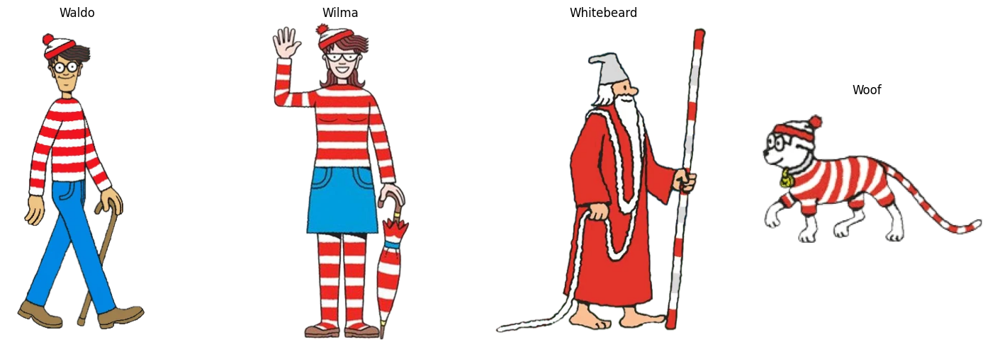

In [ ]:
# List of your object filenames
object_names = ["Waldo", "Wilma", "Whitebeard", "Woof"]
object_paths = [
    "/content/drive/MyDrive/hw_dnd/objects/Waldo.png",
    "/content/drive/MyDrive/hw_dnd/objects/Wilma.png",
    "/content/drive/MyDrive/hw_dnd/objects/Whitebeard.png",
    "/content/drive/MyDrive/hw_dnd/objects/Woof.png"
]

# Display each object using matplotlib
fig, axes = plt.subplots(1, len(object_paths), figsize=(15, 5))
for ax, name, path in zip(axes, object_names, object_paths):
    img = Image.open(path).convert("RGBA")  # ensure it keeps transparency
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(name)

plt.tight_layout()
plt.show()


## **1.2 Crawling the Web for Background Images**

To train a custom object detection model, a dataset is required. For this assignment, you will create a **synthetic dataset** by:  

- **Placing a single object at a random position** on a background image.  

The goal is to follow a similar approach to **Where’s Waldo doodles** by embedding objects into cluttered backgrounds. **Therefore, gather a selection of background images from various doodles.** This can be done manually or programmatically.  

To automate image collection, it is recommended to use `icrawler`. [Documentation](https://icrawler.readthedocs.io/en/latest/)

In [ ]:
!pip install icrawler

In [ ]:
!mkdir background

In case of any **errors, try using a different crawler**. You can use one of the following options:

```python
from icrawler.builtin import BaiduImageCrawler, BingImageCrawler, GoogleImageCrawler


In [ ]:
# Define directory path
root_dir = "/content/drive/MyDrive/hw_dnd/backgrounds"

# Ensure directory exists
os.makedirs(root_dir, exist_ok=True)

# Initialize Google Image Crawler
google_crawler = GoogleImageCrawler(
    parser_threads=2,
    downloader_threads=4,
    storage={'root_dir': root_dir}
)

# Fixed keywords list (added missing comma)
keywords = [
    'doodle background',
    'cluttered doodle background',
    'colorful doodle background',
    # 'waldo doodle background', # commented keywords might confuse the model?
    'busy cartoon background',
    'waldo doodle background',
    'hidden object puzzle background',
    'search puzzle background'
    # 'where’s wally background' # still other keywords can include the wally related backgrounds, so is it better to train the model on those backgrounds in advance?
]

# Start crawling images
for keyword in keywords:
    print(f"Searching and downloading images for: {keyword}")
    google_crawler.crawl(keyword=keyword, max_num=100, file_idx_offset='auto')

print("Image crawling completed successfully.")


Searching and downloading images for: doodle background


ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/thumbnails/021/736/703/small_2x/doodle-lines-arrows-circles-and-curves-hand-drawn-design-elements-isolated-on-white-background-for-infographic-illustration-vector.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1379780650/vector/fun-black-line-doodle-seamless-pattern.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1078105518/vector/back-to-school-doodle-seamless-pattern-vector.jpg
ERROR:downloader:Response status code 400, file https://media.gettyimages.com/id/1133192531/vector/seamless-pattern.jpg
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/thumbnails/002/289/261/small/school-education-seamless-pattern-education-symbols-sketch-backdrop-with-school-supplies-back-to-school-icons-doodle-line-art-notebook-background-vector.jpg
ERROR:downloader:Response status code 404, file ht

Searching and downloading images for: cluttered doodle background
Searching and downloading images for: colorful doodle background


ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/previews/003/476/643/non_2x/colorful-abstract-doodle-background-for-print-banner-landing-page-vector.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1498827935/vector/multi-colored-squiggles-with-circles-seamless-pattern.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1178554344/vector/hand-drawn-circles-background.jpg
ERROR:downloader:Response status code 403, file https://www.freevector.com/uploads/vector/preview/75307/vecteezybackground_no_text-pop_art-AR0622-revisi_generated.jpg
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/previews/041/417/083/non_2x/fun-abstract-background-with-multi-colored-squiggly-lines-doodle-design-with-hand-drawn-colorful-shapes-and-stripes-vector.jpg
ERROR:downloader:Response status code 404, file https://img.pikbest.com/origin/09/19/28/668pIkbEs

Searching and downloading images for: busy cartoon background


ERROR:downloader:Response status code 400, file https://media.gettyimages.com/id/1324689302/vector/city-crowds-on-the-sidewalk-and-streets.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1385690598/vector/busy-street-in-chinatown-flat-color-vector-illustration.jpg
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/thumbnails/003/316/280/original/cartoon-background-city-with-busy-streets-free-video.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1241821441/vector/social-distancing-groups-in-the-park.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1256194315/vector/people-crossing-road-vector-illustration-cartoon-flat-pedestrian-character-walking-on-zebra.jpg
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/thumbnails/003/320/990/small/cartoon-background-city-park-playground-with-kids-free-vide

Searching and downloading images for: waldo doodle background


ERROR:downloader:Response status code 403, file https://img.asmedia.epimg.net/resizer/v2/RTFORBMVGBGVZDMGZ22QNV6IBQ.jpg
ERROR:downloader:Response status code 403, file https://www.creativefabrica.com/wp-content/uploads/2023/04/11/Wheres-Waldo-An-Intricate-Detail-Coloring-Page-In-Black-And-66867919-1.png
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/previews/038/445/340/non_2x/cute-and-adorable-doodle-art-monster-black-and-white-doodle-pattern-background-suitable-for-decoration-vector.jpg
ERROR:downloader:Response status code 403, file https://img.asmedia.epimg.net/resizer/v2/VMYPXUDM2BGRVG2NMDWT6DBKQE.jpg
ERROR:downloader:Response status code 401, file https://images-wixmp-ed30a86b8c4ca887773594c2.wixmp.com/f/73d7de42-a6bb-4a02-b5f0-c9eeb16822f4/d1040fj-058bf21c-61f4-4e8f-8652-2511184e1cab.png
ERROR:downloader:Response status code 403, file https://www.creativefabrica.com/wp-content/uploads/2023/09/11/Dr-Seuss-Inspired-Hyper-Realistic-Wald

Searching and downloading images for: hidden object puzzle background


ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1339913185/vector/children-swim-underwater-with-marine-life-find-10-hidden-objects-in-the-picture-puzzle.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1323564904/vector/people-relaxing-in-the-courtyard-by-the-pool-with-water-attractions-find-10-hidden-objects.jpg
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/previews/026/754/207/non_2x/black-and-white-ecological-searching-game-with-eco-city-landscape-spot-hidden-objects-in-the-picture-and-say-how-many-earth-day-seek-and-find-and-counting-printable-coloring-page-vector.jpg
ERROR:downloader:Response status code 400, file https://media.istockphoto.com/id/1323559254/vector/girls-lying-on-the-grass-in-the-park-find-8-hidden-objects-in-the-picture.jpg
ERROR:downloader:Response status code 403, file https://static.vecteezy.com/system/resources/thumbnails/013/726/110/small_2x/bla

Searching and downloading images for: search puzzle background
Image crawling completed successfully.


Make sure to **visualize a small subset of the background images as well**!
```python
def display_sample_images(directory):
  raise NotImplementedError
```

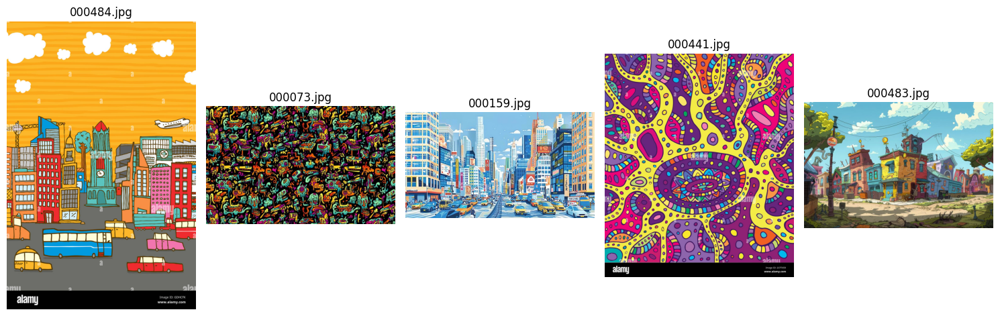

In [ ]:
def display_sample_images(directory, num_images=5):
    image_files = [
        os.path.join(directory, f)
        for f in os.listdir(directory)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ]

    selected_files = random.sample(image_files, min(num_images, len(image_files)))

    fig, axes = plt.subplots(1, len(selected_files), figsize=(15, 5))
    for ax, img_path in zip(axes, selected_files):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(os.path.basename(img_path))

    plt.tight_layout()
    plt.show()

display_sample_images('/content/drive/MyDrive/hw_dnd/backgrounds')

## **2. Creating a Synthetic Dataset**

This is a crucial part of the assignment evaluation. Using the selected objects and collected background images, follow these steps to generate your dataset:  

1. **Randomly select background images** from your dataset.  
2. **Place a single object** from your selected set into each background image at a **random location**.  
3. **Record the object's coordinates** and create a corresponding bounding box. The format should be:  
   - If an object with height $h$ and width $w$ is positioned at $(x, y)$, the bounding box should follow:  
     $$ [x_{\text{center}}, y_{\text{center}}, \text{width}, \text{height}] $$  
   - Normalize the values using:  
     $$ \left[\frac{x + w/2}{\text{image width}}, \frac{y + h/2}{\text{image height}}, \frac{w}{\text{image width}}, \frac{h}{\text{image height}}\right] $$  
     where *image* refers to the background image dimensions.  
4. **Save the generated dataset**, as it will be used for training both your custom model and fine-tuning an existing object detection model.  
5. **Wrap the dataset creation** within a PyTorch `Dataset` class for seamless data handling and model training.  
6. **Split the dataset** into training, validation, and test sets to ensure proper model evaluation.
7. **Apply various transformations** on the training and validation datasets. Only apply **tensor conversion and normalization** on the test set.

<img src="https://i.ibb.co/XrHqLmz4/2.png" alt="2" border="0">

```python
def createDataset(root_dir, dataset_name, split, img_size, num_images):
    #This my own function... It creates and saves a dataset in the following format:
    # root/
    #     dataset/
    #             train/
    #                   images/
    #                         00001.jpg
    #                   labels/
    #                         00001.txt with the content [class yolo_x, yolo_y, yolo_w, yolo_h] following the yolo format
    #             val
    #...
    # ADD YOUR CODE HERE
    raise NotImplementedError

createDataset('dataset', 'background', split='train', img_size=(640,640), num_images=5000)
createDataset('dataset', 'background', split='val', img_size=(640,640), num_images=1000)
createDataset('dataset', 'background', split='test', img_size=(640,640), num_images=200)
```

```python
class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, split, num_classes, transform):
        raise NotImplementedError
    def __len__(self):
        raise NotImplementedError
    def __getitem__(self, idx):
        raise NotImplementedError
```

In [ ]:
# Define object class IDs and paths
object_paths = {
    0: "/content/drive/MyDrive/hw_dnd/objects/Waldo.png",
    1: "/content/drive/MyDrive/hw_dnd/objects/Wilma.png",
    2: "/content/drive/MyDrive/hw_dnd/objects/Whitebeard.png",
    3: "/content/drive/MyDrive/hw_dnd/objects/Woof.png"
}

def createDataset(root_dir, dataset_name, split, img_size, num_images):
    os.makedirs(f"{root_dir}/{dataset_name}/{split}/images", exist_ok=True)
    os.makedirs(f"{root_dir}/{dataset_name}/{split}/labels", exist_ok=True)

    background_dir = "/content/drive/MyDrive/hw_dnd/backgrounds"
    background_files = [
        os.path.join(background_dir, f)
        for f in os.listdir(background_dir)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]

    for idx in tqdm(range(num_images), desc=f"Generating {split} set"):
        bg_path = random.choice(background_files)
        bg = Image.open(bg_path).convert("RGB").resize(img_size)
        img_w, img_h = img_size

        # Randomly choose object class and image
        class_id = random.choice(list(object_paths.keys()))
        obj = Image.open(object_paths[class_id]).convert("RGBA")

        # Resize object (scale between 10–30% of image width)
        scale = random.uniform(0.1, 0.3)
        obj_w = int(img_w * scale)
        obj_h = int(obj.height * (obj_w / obj.width))
        obj = obj.resize((obj_w, obj_h))

        # Random position within bounds
        max_x = img_w - obj_w
        max_y = img_h - obj_h
        x = random.randint(0, max_x)
        y = random.randint(0, max_y)

        # Paste object onto background
        bg.paste(obj, (x, y), obj)

        # YOLO bbox [x_center, y_center, width, height], normalized
        x_center = (x + obj_w / 2) / img_w
        y_center = (y + obj_h / 2) / img_h
        w_norm = obj_w / img_w
        h_norm = obj_h / img_h

        # Save image
        filename = f"{idx:05d}"
        image_path = f"{root_dir}/{dataset_name}/{split}/images/{filename}.jpg"
        label_path = f"{root_dir}/{dataset_name}/{split}/labels/{filename}.txt"
        bg.save(image_path)

        # Save label
        with open(label_path, 'w') as f:
            f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {w_norm:.6f} {h_norm:.6f}")

# Create datasets
createDataset('/content/drive/MyDrive/hw_dnd/dataset', 'background', 'train', (640, 640), 5000)
createDataset('/content/drive/MyDrive/hw_dnd/dataset', 'background', 'val', (640, 640), 1000)
createDataset('/content/drive/MyDrive/hw_dnd/dataset', 'background', 'test', (640, 640), 200)

Generating train set:   9%|▉         | 464/5000 [00:28<04:26, 17.04it/s]/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Generating test set: 100%|██████████| 200/200 [00:12<00:00, 16.06it/s]


In [25]:
class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, split, transform=None):
        """
        Args:
            root_dir (str): Path to dataset root directory.
            split (str): One of 'train', 'val', 'test'.
            transform (callable, optional): Transformations to apply on the image.
        """
        self.image_dir = os.path.join(root_dir, split, 'images')
        self.label_dir = os.path.join(root_dir, split, 'labels')
        self.transform = transform
        self.split = split  # Store split type

        # Get list of image files
        self.image_filenames = [f for f in os.listdir(self.image_dir) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        # Get image path
        img_filename = self.image_filenames[idx]
        img_path = os.path.join(self.image_dir, img_filename)

        # Open image
        image = Image.open(img_path).convert("RGB")

        # Get label path
        label_filename = img_filename.replace('.jpg', '.txt')
        label_path = os.path.join(self.label_dir, label_filename)

        # Load bounding box
        with open(label_path, 'r') as f:
            label_data = f.readline().strip().split()

        class_id = int(label_data[0])
        bbox = np.array(label_data[1:], dtype=np.float32)  # [x_center, y_center, width, height]

        # Convert bounding box to tensor
        bbox_tensor = torch.tensor([class_id] + bbox.tolist(), dtype=torch.float32)

        # Apply RandomHorizontalFlip only for training
        if self.split == "train" and torch.rand(1).item() > 0.5:
            image = transforms.functional.hflip(image)
            x_center, y_center, width, height = bbox_tensor[1:]
            x_center = 1.0 - x_center  # Adjust x_center for flipped image
            bbox_tensor[1] = x_center

        # Apply general transformations
        if self.transform:
            image = self.transform(image)

        return image, bbox_tensor

In [26]:
# Define transformations
train_transform = transforms.Compose([
    transforms.Resize((640, 640)),
    # transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    # transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_transform = transforms.Compose([
    transforms.Resize((640, 640)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

test_transform = transforms.Compose([
    transforms.Resize((640, 640)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

## **3. Creating Dataloaders**

For the **DataLoader**, ensure that the **batch size** is appropriate so that it fits into memory. Set the **`shuffle`** parameter as follows:

- **Training & Validation DataLoaders:** `shuffle=True` (to randomize the order of samples)  
- **Test DataLoader:** `shuffle=False` (to maintain consistency in evaluation)

In [28]:
train_dataset = ObjectDetectionDataset('/content/drive/MyDrive/hw_dnd/dataset/background', 'train', transform=train_transform)
val_dataset = ObjectDetectionDataset('/content/drive/MyDrive/hw_dnd/dataset/background', 'val', transform=val_transform)
test_dataset = ObjectDetectionDataset('/content/drive/MyDrive/hw_dnd/dataset/background', 'test', transform=test_transform)

# Set batch size
batch_size = 32  # Adjust based on your memory constraints

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

print(f"Training Dataset Size: {len(train_dataset)}")
print(f"Validation Dataset Size: {len(val_dataset)}")
print(f"Test Dataset Size: {len(test_dataset)}")

Training Dataset Size: 5000
Validation Dataset Size: 1000
Test Dataset Size: 200


## **4. Visualizing the Training Data**

To visualize the training data, extract a batch from the training `DataLoader` and plot the **input images with their respective bounding box and class label** using `Matplotlib` or `Seaborn`. Ensure that at least **8 datapoints** are displayed for a clear representation.

```python
def visualize_batch():
  raise NotImplementedError
```

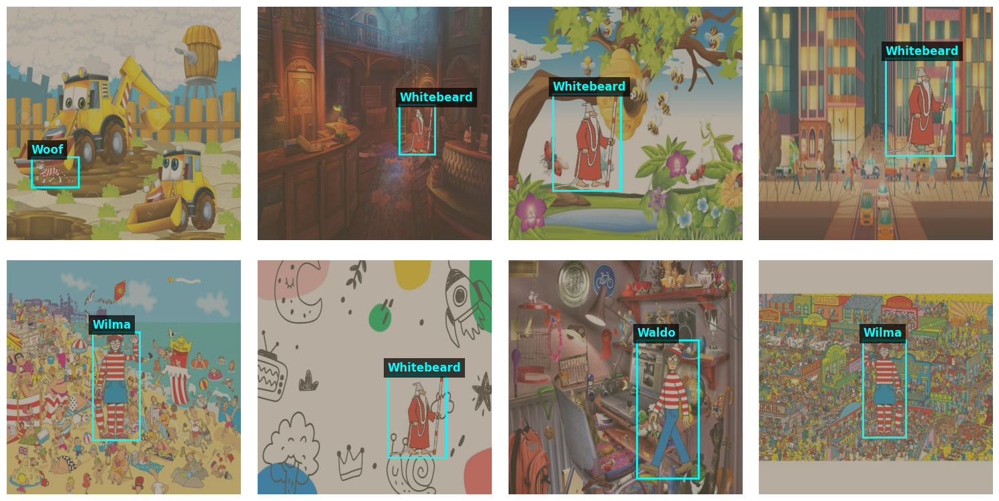

In [ ]:
# Class labels for reference
class_labels = {0: "Waldo", 1: "Wilma", 2: "Whitebeard", 3: "Woof"}

def denormalize_image(img_tensor, mean, std):
    """
    Denormalizes a normalized image tensor.

    Args:
        img_tensor (torch.Tensor): Normalized image tensor of shape (C, H, W).
        mean (list or tuple): Mean values used for normalization.
        std (list or tuple): Std values used for normalization.

    Returns:
        torch.Tensor: Denormalized image tensor in range [0, 1].
    """
    mean = torch.tensor(mean).view(-1, 1, 1)
    std = torch.tensor(std).view(-1, 1, 1)
    denorm = img_tensor * std + mean
    return torch.clamp(denorm, 0, 1)

def visualize_batch(train_loader, mean, std, num_samples=8):
    """
    Visualizes a batch of training images with bounding boxes.

    Args:
        train_loader (DataLoader): DataLoader for the training dataset.
        mean (list or tuple): Mean values used for normalization.
        std (list or tuple): Std values used for normalization.
        num_samples (int): Number of images to visualize (default: 8).
    """
    # Get a batch of training data
    images, targets = next(iter(train_loader))  # Get one batch

    num_samples = min(num_samples, len(images))  # Ensure at most `num_samples` images are displayed

    # Create a 2-row, 4-column figure (or adjust dynamically)
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    axes = axes.flatten()  # Flatten axes for easy iteration

    for i in range(num_samples):
        img = images[i]
        target = targets[i]

        # Denormalize image
        img_denorm = denormalize_image(img, mean, std)
        img_np = img_denorm.permute(1, 2, 0).cpu().numpy()  # Convert tensor to NumPy (H, W, C)

        # Plot image
        ax = axes[i]
        ax.imshow(img_np)
        ax.axis("off")

        # Ensure target is in correct format
        if target.ndimension() == 1:
            target = target.unsqueeze(0)  # Convert to (1, 5) if only one bounding box

        # Extract bounding box info
        for t in target:
            t = t.tolist()
            if len(t) == 5:  # Ensure correct unpacking
                class_id, x_center, y_center, w, h = t

                img_w, img_h = img_np.shape[1], img_np.shape[0]  # Get original image dimensions
                x = (x_center - w / 2) * img_w
                y = (y_center - h / 2) * img_h
                w = w * img_w
                h = h * img_h

                # Draw bounding box (cyan color)
                rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor="cyan", facecolor="none")
                ax.add_patch(rect)

                # Ensure label text stays within the image
                label_y = max(y - 10, 10)  # Ensure text doesn't go off the image

                # Add text above the bounding box
                label_text = class_labels.get(int(class_id), "Unknown")
                ax.text(
                    x, label_y, label_text, color="cyan", fontsize=12, fontweight="bold",
                    bbox=dict(facecolor="black", alpha=0.7, edgecolor="none")  # Background for better visibility
                )

    plt.tight_layout()
    plt.show()

# Call the function to visualize a batch
visualize_batch(
    train_loader,
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225],
    num_samples=8
)

## **5. Creating a Custom Object Detection Model**

In this assignment, you are tasked with building your own custom object detection model.

Design a CNN-based architecture that includes a **backbone for feature extraction** and **two output branches**:

- One for **class probabilities** (with output size equal to the number of object classes, e.g., 3).
- Another for **bounding box regression** (with size 4 for the box coordinates: $[x_{center}, y_{center}, width, height]$).

This is the **core evaluation of the assignment**. Experiment with different layers, hyperparameters, and regularization techniques to optimize the model's performance.

> **Note**: You **ARE** allowed to use a pre-trained backbone (`VGG`, `ResNet`) for this task. You are free to fine-tune the pre-trained backbone or just freeze is completely.

```python
class CustomModel(nn.Module):
    def __init__(self, num_classes=3):
        super(CustomModel, self).__init__()
        raise NotImplementedError

    def forward(self, x):
        raise NotImplementedError
```

In [19]:
class CustomModel(nn.Module):
    def __init__(self, num_classes=3, backbone="resnet18", pretrained=True):
        """
        Custom Object Detection Model with a CNN backbone.

        Args:
            num_classes (int): Number of object classes.
            backbone (str): CNN backbone ('resnet18', 'resnet34', 'resnet50', etc.).
            pretrained (bool): Whether to use pre-trained weights.
        """
        super(CustomModel, self).__init__()

        # Load a pre-trained ResNet as the backbone
        if backbone == "resnet18":
            self.backbone = models.resnet18(pretrained=pretrained)
        elif backbone == "resnet34":
            self.backbone = models.resnet34(pretrained=pretrained)
        elif backbone == "resnet50":
            self.backbone = models.resnet50(pretrained=pretrained)
        else:
            raise ValueError("Unsupported backbone! Choose from 'resnet18', 'resnet34', 'resnet50'.")

        # Remove the final classification layer (fully connected layer)
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-2])  # Keep feature extractor

        # Define feature map output channels (depends on backbone)
        if backbone in ["resnet18", "resnet34"]:
            feature_dim = 512  # ResNet18 & ResNet34 output 512 channels
        else:
            feature_dim = 2048  # ResNet50 outputs 2048 channels

        # Global Average Pooling (GAP) to reduce feature dimensions
        self.global_pool = nn.AdaptiveAvgPool2d(1)

        # Classification head (for predicting object class probabilities)
        self.class_head = nn.Sequential(
            nn.Linear(feature_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes),
        )

        # Bounding box regression head (for predicting x_center, y_center, width, height)
        self.bbox_head = nn.Sequential(
            nn.Linear(feature_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 4),  # 4 outputs (x_center, y_center, width, height)
        )

        # self.bbox_head = nn.Sequential(
        #     nn.Linear(feature_dim, 256),
        #     nn.ReLU(),
        #     nn.BatchNorm1d(256),
        #     nn.Dropout(0.3),
        #     nn.Linear(256, 128),
        #     nn.ReLU(),
        #     nn.BatchNorm1d(128),
        #     nn.Linear(128, 4),  # Output: [x_center, y_center, width, height]
        # )

        # self.class_head = nn.Sequential(
        #     nn.Linear(feature_dim, 256),
        #     nn.ReLU(),
        #     nn.BatchNorm1d(256),  # Normalization for stability
        #     nn.Dropout(0.3),
        #     nn.Linear(256, 128),
        #     nn.ReLU(),
        #     nn.BatchNorm1d(128),
        #     nn.Linear(128, num_classes),
        # )




    def forward(self, x):
        """
        Forward pass of the model.

        Args:
            x (torch.Tensor): Input image tensor of shape (B, C, H, W).

        Returns:
            class_logits (torch.Tensor): Predicted class probabilities (B, num_classes).
            bbox_preds (torch.Tensor): Predicted bounding box coordinates (B, 4).
        """
        features = self.backbone(x)  # Extract features from CNN backbone
        pooled_features = self.global_pool(features).view(features.size(0), -1)  # Apply GAP

        class_logits = self.class_head(pooled_features)  # Class probabilities
        bbox_preds = self.bbox_head(pooled_features)  # Bounding box coordinates

        return class_logits, bbox_preds




model = CustomModel(num_classes=4, backbone="resnet18", pretrained=True)
model.eval()

sample_input = torch.randn(1, 3, 640, 640)  # Example image batch (B, C, H, W)
class_logits, bbox_preds = model(sample_input)

print("Class Predictions:", class_logits.shape)  # (B, num_classes)
print("Bounding Box Predictions:", bbox_preds.shape)  # (B, 4)
print(bbox_preds)
print(class_logits)

Class Predictions: torch.Size([1, 4])
Bounding Box Predictions: torch.Size([1, 4])
tensor([[-0.1149, -0.0022, -0.0094,  0.0253]], grad_fn=<AddmmBackward0>)
tensor([[ 0.1226, -0.0031, -0.0114,  0.2546]], grad_fn=<AddmmBackward0>)


## **6.1 Plotting Model Parameter Count and Size**

A convenient way to inspect the number of parameters in a defined `nn.Module` is by using the `torchsummary` package. This package provides a detailed summary of the model architecture, including the number of parameters in each layer, their shapes, and the total parameter count.

To use `torchsummary`, you need to pass a dummy tensor with the specified input shape. The package will then traverse the model, layer by layer, calculating the total number of trainable and non-trainable parameters while also displaying the output shapes at each stage.

Sumnmarize **both models**!

```python
model = CustomModel().to(device)
summary(model, input_size = )
```

In [20]:
from torchsummary import summary

# Define the input size (batch size of 1, 3 channels, 640x640 image)
input_size = (3, 640, 640)
model.to(device)
# Get the summary
summary(model, input_size=input_size)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 320, 320]           9,408
       BatchNorm2d-2         [-1, 64, 320, 320]             128
              ReLU-3         [-1, 64, 320, 320]               0
         MaxPool2d-4         [-1, 64, 160, 160]               0
            Conv2d-5         [-1, 64, 160, 160]          36,864
       BatchNorm2d-6         [-1, 64, 160, 160]             128
              ReLU-7         [-1, 64, 160, 160]               0
            Conv2d-8         [-1, 64, 160, 160]          36,864
       BatchNorm2d-9         [-1, 64, 160, 160]             128
             ReLU-10         [-1, 64, 160, 160]               0
       BasicBlock-11         [-1, 64, 160, 160]               0
           Conv2d-12         [-1, 64, 160, 160]          36,864
      BatchNorm2d-13         [-1, 64, 160, 160]             128
             ReLU-14         [-1, 64, 1

## **6.2 Defining Loss Function and Optimizer**

**Loss Functions and their options:**

For our custom object detection task, we are performing both **regression** (for bounding box coordinates) and **classification** (for object categories). Our network predicts **continuous** bounding box values, along with a **discrete** class label, meaning that our chosen loss function should effectively be a composite of two losses:  

1. **A regression loss** for bounding box prediction.  
2. **A classification loss** for object label prediction.  

Here are some common loss functions that can be used:  

---

### **a. Mean Squared Error (MSE) Loss** (Bounding Box Regression)  
MSE loss is a standard choice for regression tasks, as it penalizes larger errors more strongly than smaller ones. For bounding box prediction, this ensures that predicted box coordinates are as close as possible to the ground truth.  

$$
\mathcal{L}_{MSE} = \frac{1}{N} \sum_{i=1}^{N} (y_i - \hat{y}_i)^2
$$  

where $ y_i $ is the ground truth bounding box coordinate and $ \hat{y}_i $ is the predicted coordinate.  

- **Pros:** Simple, computationally efficient, commonly used in regression tasks.  
- **Cons:** Sensitive to outliers since it squares errors, which may cause instability when predicting bounding boxes.  

---

### **b. Cross-Entropy Loss (Classification Loss)**  
For predicting object classes, **Cross-Entropy Loss** is the most commonly used loss function in classification tasks. It is defined as:  

$$
\mathcal{L}_{CE} = -\sum_{i=1}^{C} y_i \log(\hat{y}_i)
$$  

where $ C $ is the total number of object classes, $ y_i $ is the ground truth label (one-hot encoded), and $ \hat{y}_i $ is the predicted probability for that class.  

- **Pros:** Standard for classification, provides well-calibrated probabilities.  
- **Cons:** Can be affected by class imbalances; label smoothing or weighted loss may be needed.  

---

### **c. Huber Loss (Smooth Bounding Box Regression Loss)**  
Huber Loss is an improvement over MSE that reduces sensitivity to outliers. It applies MSE for small errors and Mean Absolute Error (MAE) for larger errors:  

$$
\mathcal{L}_{Huber} =
\begin{cases}
\frac{1}{2} (y_i - \hat{y}_i)^2, & \text{if} \ |y_i - \hat{y}_i| \leq \delta \\
\delta (|y_i - \hat{y}_i| - \frac{1}{2} \delta), & \text{otherwise}
\end{cases}
$$  

where $ \delta $ is a threshold that determines when the loss transitions from quadratic to linear.  

- **Pros:** More robust than MSE, reduces the effect of outliers on bounding box predictions.  
- **Cons:** Requires tuning of $ \delta $ for optimal performance.  

---

### **d. Intersection over Union (IoU) Loss (Bounding Box Alignment Loss)**  
IoU Loss directly optimizes the overlap between the predicted and ground-truth bounding boxes:  

$$
\mathcal{L}_{IoU} = 1 - \frac{\text{Intersection Area}}{\text{Union Area}}
$$  

This loss ensures that the model prioritizes bounding box alignment rather than just minimizing coordinate differences.  

- **Pros:** More appropriate for object detection since it directly optimizes box overlap.  
- **Cons:** Harder to optimize, as gradients may vanish when boxes do not overlap.  

---

[PyTorch Documentation](https://pytorch.org/docs/stable/nn.html#loss-functions)

---

**Optimizers and their options:**

There are some pre-built [Optimizers in PyTorch](https://pytorch.org/docs/stable/optim.html), they are sufficient in most cases, especially if their parameters are well set. The two most well-known are Adam (AdamW) and SGD, both of which originate from Gradient Descent, which we implemented earlier.

* **S**tochastic **G**radient **D**escent ([SGD](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html))
* **ADA**ptive **M**oment optimizer ([ADAM](https://pytorch.org/docs/stable/generated/torch.optim.Adam.html))
* [A good general overview](https://www.ruder.io/optimizing-gradient-descent/)

In [21]:
# Define loss functions
classification_loss_fn = nn.CrossEntropyLoss()  # For class predictions
bbox_loss_fn = nn.SmoothL1Loss()  # Huber Loss for bounding box regression

# Define the optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)  # Adam optimizer with weight decay

## **7. Training the Custom Object Detection Model**

When implementing the training loop, ensure the following key aspects are included:

- Set an **appropriate number of epochs** for model training, balancing between underfitting and overfitting.
- Maintain running losses throughout each epoch and compute both **training losses** and **validation losses** per epoch.
- Implement an **early stopping mechanism** to halt training if validation loss stops improving, preventing unnecessary overfitting.
- **Save the model at its best-performing epoch** based on validation loss, ensuring the best version is retained for inference.
- Ensure you're optimizing both **classification loss** and **bounding box regression loss**.

In [ ]:
# Early stopping and model saving setup
epochs = 10
patience = 2  # Early stopping patience (epochs without improvement)
best_val_loss = float('inf')  # Best validation loss
early_stop_counter = 0  # Counter for early stopping
model_save_path = '/content/drive/MyDrive/hw_dnd/best_model.pth'  # File path for saving the best model

# Tracking losses for visualization or logging
train_losses = []
val_losses = []

# Training loop
print("Training Object Detection Model...")
for epoch in range(epochs):
    model.train()  # Set model to training mode
    running_train_loss_class = 0.0
    running_train_loss_bbox = 0.0
    num_batches = len(train_loader)

    for batch_idx, (images, targets) in enumerate(train_loader):
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()  # Zero the gradients

        # Forward pass
        class_logits, bbox_preds = model(images)

        # Extract class labels and bounding box targets
        class_labels = targets[:, 0].long()  # Class labels (first element in bbox tensor)
        bbox_targets = targets[:, 1:]  # Bounding box targets (remaining elements)

        # Compute classification loss
        class_loss = classification_loss_fn(class_logits, class_labels)

        # Compute bounding box loss
        bbox_loss = bbox_loss_fn(bbox_preds, bbox_targets)

        # Total loss
        total_loss = class_loss + bbox_loss

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_train_loss_class += class_loss.item()
        running_train_loss_bbox += bbox_loss.item()

        # Print losses for every 10th batch (or any other interval)
        if (batch_idx + 1) % 1 == 0:  # Every 10th batch
            avg_class_loss = running_train_loss_class / (batch_idx + 1)
            avg_bbox_loss = running_train_loss_bbox / (batch_idx + 1)
            print(f"Epoch [{epoch+1}/{epochs}] - Batch [{batch_idx+1}/{num_batches}] - "
                  f"Class Loss: {avg_class_loss:.4f}, BBox Loss: {avg_bbox_loss:.4f}")

    # Compute average training loss for the epoch
    avg_train_loss_class = running_train_loss_class / len(train_loader)
    avg_train_loss_bbox = running_train_loss_bbox / len(train_loader)
    train_losses.append((avg_train_loss_class, avg_train_loss_bbox))  # Store losses for tracking

    # Validation phase
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        val_loss_class = 0.0
        val_loss_bbox = 0.0
        for val_images, val_targets in val_loader:
            val_images = val_images.to(device)
            val_targets = val_targets.to(device)

            # Forward pass for validation
            class_logits, bbox_preds = model(val_images)

            # Extract class labels and bounding box targets
            class_labels = val_targets[:, 0].long()
            bbox_targets = val_targets[:, 1:]

            # Compute classification loss
            class_loss = classification_loss_fn(class_logits, class_labels)

            # Compute bounding box loss
            bbox_loss = bbox_loss_fn(bbox_preds, bbox_targets)

            # Accumulate validation losses
            val_loss_class += class_loss.item()
            val_loss_bbox += bbox_loss.item()

        # Compute average validation loss
        avg_val_loss_class = val_loss_class / len(val_loader)
        avg_val_loss_bbox = val_loss_bbox / len(val_loader)
        val_losses.append((avg_val_loss_class, avg_val_loss_bbox))

        avg_val_loss = avg_val_loss_class + avg_val_loss_bbox  # Total validation loss

    # Early stopping check and model saving
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        early_stop_counter = 0
        torch.save(model.state_dict(), model_save_path)  # Save the best model
    else:
        early_stop_counter += 1

    if early_stop_counter >= patience:
        print(f"Early stopping triggered. Training will stop at epoch {epoch+1}.")
        break

    # Print the loss for this epoch
    print(f"Epoch [{epoch+1}/{epochs}] - "
          f"Train Class Loss: {avg_train_loss_class:.4f}, "
          f"Train BBox Loss: {avg_train_loss_bbox:.4f}, "
          f"Val Class Loss: {avg_val_loss_class:.4f}, "
          f"Val BBox Loss: {avg_val_loss_bbox:.4f}")

# After training, restore the best model for inference
model.load_state_dict(torch.load(model_save_path))
model.eval()

# Print final losses
print(f"Final Training Loss (Class): {train_losses[-1][0]:.4f}, (BBox): {train_losses[-1][1]:.4f}")
print(f"Final Validation Loss (Class): {val_losses[-1][0]:.4f}, (BBox): {val_losses[-1][1]:.4f}")

Training Object Detection Model...
Epoch [1/10] - Batch [1/157] - Class Loss: 1.3959, BBox Loss: 0.1077
Epoch [1/10] - Batch [2/157] - Class Loss: 1.4858, BBox Loss: 0.1091
Epoch [1/10] - Batch [3/157] - Class Loss: 1.5684, BBox Loss: 0.1047
Epoch [1/10] - Batch [4/157] - Class Loss: 1.5740, BBox Loss: 0.0896
Epoch [1/10] - Batch [5/157] - Class Loss: 1.5186, BBox Loss: 0.0806
Epoch [1/10] - Batch [6/157] - Class Loss: 1.4857, BBox Loss: 0.0753
Epoch [1/10] - Batch [7/157] - Class Loss: 1.4486, BBox Loss: 0.0710
Epoch [1/10] - Batch [8/157] - Class Loss: 1.4182, BBox Loss: 0.0672
Epoch [1/10] - Batch [9/157] - Class Loss: 1.3873, BBox Loss: 0.0639
Epoch [1/10] - Batch [10/157] - Class Loss: 1.3564, BBox Loss: 0.0599
Epoch [1/10] - Batch [11/157] - Class Loss: 1.3165, BBox Loss: 0.0567
Epoch [1/10] - Batch [12/157] - Class Loss: 1.2811, BBox Loss: 0.0538
Epoch [1/10] - Batch [13/157] - Class Loss: 1.2482, BBox Loss: 0.0514
Epoch [1/10] - Batch [14/157] - Class Loss: 1.2120, BBox Loss: 0

## **8.1 Visualizing Training Metrics**

- **Restore the model's parameters** from the checkpoint where validation loss was lowest to use the most optimal version of the model.
- Use `Matplotlib` or `Seaborn` to plot the loss curves over epochs.

Did your model **converge**? Explain your results!

```python
def plot_losses():
  raise NotImplementedError
```

In [67]:
model.to(device)  # Move model to the appropriate device (if needed)
model_save_path = '/content/drive/MyDrive/hw_dnd/best_model.pth'  # File path for saving the best model

# Load the model state dictionary to the CPU
model.load_state_dict(torch.load(model_save_path))
model.eval()


CustomModel(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=

> **Answer:** Both the Classification and Regression heads of the model are able to converge almost every time, with both achieving near-zero loss. However, while the Regression head converges quite steadily, the Classification head struggles a bit in this regard.

> In terms of performance on the test dataset, the Classification head still performs well, but the Regression head performs poorly. It can somewhat determine the width and height of the bounding box, but the x and y coordinates of the center of the bounding box remain fixed at the center of the image. I attempted to deepen the network by adding more layers, but this did not lead to any improvements.

> Based on the Bounding Box Loss plot below, it seems highly likely that the issue lies in how I am normalizing the x and y values.

Epoch	Train Class Loss	Train BBox Loss	Validation Class Loss	Validation BBox Loss
1	0.2086		0.0209		7.4569		0.0392
2	0.0257		0.0165		0.0167		0.0134
3	0.0063		0.0157		0.0026		0.0141
4	0.0185		0.0154		1.9165		0.0125
5	0.0500		0.0148		0.3290		0.0150


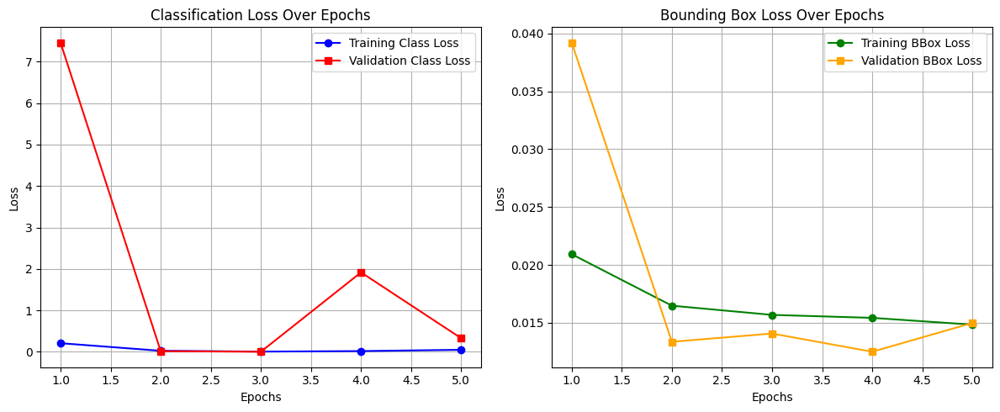

In [ ]:
import matplotlib.pyplot as plt

def plot_losses(train_losses, val_losses):
    """
    Plots the training and validation losses over epochs and prints the losses.

    Args:
        train_losses (list of tuples): List containing (class_loss, bbox_loss) for training.
        val_losses (list of tuples): List containing (class_loss, bbox_loss) for validation.
    """
    epochs = range(1, len(train_losses) + 1)

    # Extracting losses for easier manipulation
    train_class_losses = [loss[0] for loss in train_losses]
    train_bbox_losses = [loss[1] for loss in train_losses]
    val_class_losses = [loss[0] for loss in val_losses]
    val_bbox_losses = [loss[1] for loss in val_losses]

    # Printing the losses for each epoch
    print("Epoch\tTrain Class Loss\tTrain BBox Loss\tValidation Class Loss\tValidation BBox Loss")
    for epoch in range(len(train_losses)):
        print(f"{epoch + 1}\t{train_class_losses[epoch]:.4f}\t\t{train_bbox_losses[epoch]:.4f}\t\t{val_class_losses[epoch]:.4f}\t\t{val_bbox_losses[epoch]:.4f}")

    # Plotting the losses
    plt.figure(figsize=(12, 5))

    # Plot Classification Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_class_losses, label="Training Class Loss", color='b', marker='o')
    plt.plot(epochs, val_class_losses, label="Validation Class Loss", color='r', marker='s')
    plt.title("Classification Loss Over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Plot Bounding Box Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_bbox_losses, label="Training BBox Loss", color='g', marker='o')
    plt.plot(epochs, val_bbox_losses, label="Validation BBox Loss", color='orange', marker='s')
    plt.title("Bounding Box Loss Over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Show the plots
    plt.tight_layout()
    plt.show()

# Assuming train_losses and val_losses are defined
# Call the function to visualize training and validation loss curves
plot_losses(train_losses, val_losses)


## **8.2 Running Inference on the Custom Object Detection Model**

After training your **custom object detection model**, evaluate its performance by passing test images through it. Select **at least three** key evaluation metrics to assess the model’s effectiveness. Potential metrics include:

### **Key Object Detection Metrics**
- **Precision**: Measures the proportion of correctly detected objects among all predicted objects.
- **Recall**: Represents the proportion of correctly detected objects out of all actual objects present in the image.
- **F1-Score**: The harmonic mean of Precision and Recall, balancing false positives and false negatives.
- **IoU (Intersection over Union)**: Computes the ratio of overlap between the predicted bounding box and the ground truth bounding box.
- **mAP (mean Average Precision)**: A widely used metric that calculates precision at multiple recall thresholds and averages them across all object classes.

### **Additional Model Performance Metrics**
- **Inference Speed**: Measure the time taken to process a single image.
- **Number of Parameters**: Count the total trainable parameters in your model.
- **Model Size**: Evaluate the storage space required for the trained model.


```python
def test_model()
  raise NotImplementedError

def calculate_iou()
  raise NotImplementedError

def calculate_map()
  raise NotImplementedError
```

In [29]:
import torch
import torch.nn.functional as F
import numpy as np

def test_model(model, test_loader, device):
    """
    Runs inference on test images and evaluates model performance.

    Args:
        model (torch.nn.Module): Trained object detection model.
        test_loader (DataLoader): DataLoader containing test dataset.
        device (torch.device): Device (CPU or GPU) to run inference on.

    Returns:
        dict: Dictionary containing evaluation metrics (Precision, Recall, F1-score, IoU, mAP).
    """
    model.to(device)
    model.eval()

    all_preds = []
    all_targets = []
    all_ious = []

    with torch.no_grad():
        for images, targets in test_loader:
            images = images.to(device)
            targets = targets.to(device)

            # Forward pass
            class_logits, bbox_preds = model(images)

            # Convert logits to probabilities
            class_probs = F.softmax(class_logits, dim=1)
            class_preds = torch.argmax(class_probs, dim=1)

            # Store predictions and ground truth
            all_preds.append((class_preds.cpu().numpy(), bbox_preds.cpu().numpy()))
            all_targets.append((targets[:, 0].cpu().numpy(), targets[:, 1:].cpu().numpy()))

            # Compute IoU for each image in batch
            for pred_bbox, gt_bbox in zip(bbox_preds, targets[:, 1:]):
                iou = calculate_iou(pred_bbox.cpu().numpy(), gt_bbox.cpu().numpy())
                all_ious.append(iou)

    # Flatten lists
    pred_classes, pred_bboxes = zip(*all_preds)
    true_classes, true_bboxes = zip(*all_targets)

    pred_classes = np.concatenate(pred_classes)
    pred_bboxes = np.concatenate(pred_bboxes)
    true_classes = np.concatenate(true_classes)
    true_bboxes = np.concatenate(true_bboxes)

    # Compute Precision, Recall, F1-score
    tp = np.sum(pred_classes == true_classes)  # True Positives
    fp = np.sum(pred_classes != true_classes)  # False Positives
    fn = np.sum(true_classes != pred_classes)  # False Negatives

    precision = tp / (tp + fp + 1e-6)  # Avoid division by zero
    recall = tp / (tp + fn + 1e-6)
    f1_score = 2 * (precision * recall) / (precision + recall + 1e-6)

    # Compute mAP
    map_score = calculate_map(pred_bboxes, true_bboxes, pred_classes, true_classes)

    # Compute average IoU
    avg_iou = np.mean(all_ious)

    metrics = {
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1_score,
        "IoU": avg_iou,
        "mAP": map_score
    }

    return metrics


def calculate_iou(pred_bbox, gt_bbox):
    """
    Computes Intersection over Union (IoU) between predicted and ground truth bounding boxes.

    Args:
        pred_bbox (numpy.ndarray): Predicted bounding box [x_center, y_center, width, height].
        gt_bbox (numpy.ndarray): Ground truth bounding box [x_center, y_center, width, height].

    Returns:
        float: IoU score.
    """
    # Convert (x_center, y_center, width, height) to (x1, y1, x2, y2)
    pred_x1, pred_y1 = pred_bbox[0] - pred_bbox[2] / 2, pred_bbox[1] - pred_bbox[3] / 2
    pred_x2, pred_y2 = pred_bbox[0] + pred_bbox[2] / 2, pred_bbox[1] + pred_bbox[3] / 2

    gt_x1, gt_y1 = gt_bbox[0] - gt_bbox[2] / 2, gt_bbox[1] - gt_bbox[3] / 2
    gt_x2, gt_y2 = gt_bbox[0] + gt_bbox[2] / 2, gt_bbox[1] + gt_bbox[3] / 2

    # Compute intersection area
    inter_x1 = max(pred_x1, gt_x1)
    inter_y1 = max(pred_y1, gt_y1)
    inter_x2 = min(pred_x2, gt_x2)
    inter_y2 = min(pred_y2, gt_y2)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)

    # Compute union area
    pred_area = (pred_x2 - pred_x1) * (pred_y2 - pred_y1)
    gt_area = (gt_x2 - gt_x1) * (gt_y2 - gt_y1)

    union_area = pred_area + gt_area - inter_area

    # Compute IoU
    iou = inter_area / (union_area + 1e-6)  # Avoid division by zero

    return iou


def calculate_map(pred_bboxes, gt_bboxes, pred_classes, gt_classes, iou_threshold=0.5):
    """
    Computes mean Average Precision (mAP) for object detection.

    Args:
        pred_bboxes (numpy.ndarray): Predicted bounding boxes.
        gt_bboxes (numpy.ndarray): Ground truth bounding boxes.
        pred_classes (numpy.ndarray): Predicted class labels.
        gt_classes (numpy.ndarray): Ground truth class labels.
        iou_threshold (float): IoU threshold for considering a detection as True Positive.

    Returns:
        float: mAP score.
    """
    unique_classes = np.unique(gt_classes)
    average_precisions = []

    for cls in unique_classes:
        # Filter detections and ground truths by class
        cls_pred_indices = pred_classes == cls
        cls_gt_indices = gt_classes == cls

        cls_pred_bboxes = pred_bboxes[cls_pred_indices]
        cls_gt_bboxes = gt_bboxes[cls_gt_indices]

        if len(cls_gt_bboxes) == 0:
            continue

        # Sort predictions by confidence scores (assumed to be in descending order)
        sorted_indices = np.argsort(-cls_pred_bboxes[:, -1])  # Assume last column is confidence score
        cls_pred_bboxes = cls_pred_bboxes[sorted_indices]


        tp = np.zeros(len(cls_pred_bboxes))
        fp = np.zeros(len(cls_pred_bboxes))
        matched_gt = set()

        # Compute TP/FP
        for i, pred_bbox in enumerate(cls_pred_bboxes):
            ious = [calculate_iou(pred_bbox, gt_bbox) for gt_bbox in cls_gt_bboxes]
            best_iou_idx = np.argmax(ious)
            best_iou = ious[best_iou_idx]

            if best_iou >= iou_threshold and best_iou_idx not in matched_gt:
                tp[i] = 1  # True Positive
                matched_gt.add(best_iou_idx)
            else:
                fp[i] = 1  # False Positive

        # Compute Precision-Recall Curve
        accumulated_tp = np.cumsum(tp)
        accumulated_fp = np.cumsum(fp)

        precision = accumulated_tp / (accumulated_tp + accumulated_fp + 1e-6)
        recall = accumulated_tp / (len(cls_gt_bboxes) + 1e-6)

        # Compute AP using the 11-point interpolation method
        precisions = np.concatenate(([0], precision, [0]))
        recalls = np.concatenate(([0], recall, [1]))

        for i in range(len(precisions) - 1, 0, -1):
            precisions[i - 1] = max(precisions[i - 1], precisions[i])

        recall_levels = np.linspace(0, 1, 11)
        interpolated_precisions = [max(precisions[recalls >= r]) for r in recall_levels]

        ap = np.mean(interpolated_precisions)
        average_precisions.append(ap)

    return np.mean(average_precisions) if average_precisions else 0.0

test_model(model, test_loader, device)

{'Precision': np.float64(0.999999995),
 'Recall': np.float64(0.999999995),
 'F1-Score': np.float64(0.99999949500025),
 'IoU': np.float32(0.08583236),
 'mAP': np.float64(0.0833332714646993)}

## **8.3 Visualizing Model Predictions**
- Select a set of test images and display them with **predicted bounding boxes** overlaid.
- Compare predictions against the **ground truth bounding boxes** to visually assess model accuracy.
- Annotate each prediction with relevant metrics (Precision, Recall, IoU) to highlight how well the model performs.

For detailed tracking and logging, consider using **Weights and Biases (WandB)** or **TensorBoard** to visualize training progress, compare models, and gain deeper insights into your results.

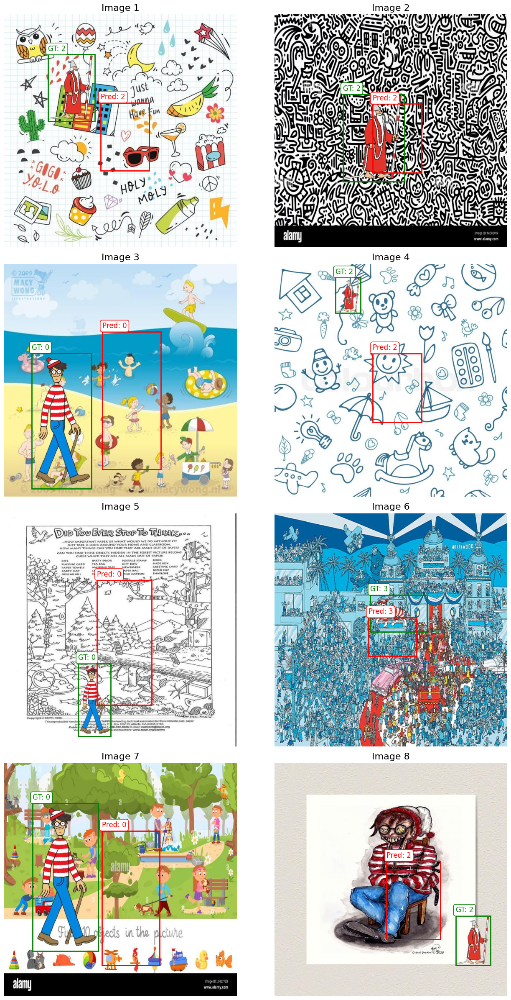

In [85]:
def visualize_predictions(model, dataloader, device, num_images=4):
    """
    Visualizes model predictions by displaying images with predicted bounding boxes and ground truth boxes.

    Args:
        model (torch.nn.Module): The trained object detection model.
        dataloader (DataLoader): The DataLoader to provide the test dataset.
        device (torch.device): The device on which the model is running (CPU/GPU).
        num_images (int): The number of images to visualize from the test set.
    """
    model.eval()  # Set model to evaluation mode

    # Get one batch of images and targets
    images, targets = next(iter(dataloader))
    images = images.to(device)
    targets = targets.to(device)

    # Randomly select `num_images` indices from the batch
    indices = np.random.choice(len(images), size=num_images, replace=False)

    # Set up a matplotlib grid with `num_images` images (2 per row if num_images > 2)
    num_rows = (num_images + 1) // 2
    fig, axes = plt.subplots(num_rows, 2, figsize=(14, 6 * num_rows))
    axes = axes.ravel()  # Flatten the 2D array of axes for easy indexing

    with torch.no_grad():
        # Get model predictions
        class_logits, bbox_preds = model(images)

        # Get predicted class labels (highest probability)
        class_probs = torch.softmax(class_logits, dim=1)
        class_preds = torch.argmax(class_probs, dim=1)

        # Convert predictions and targets to CPU for visualization
        images = images.cpu()
        class_preds = class_preds.cpu()
        bbox_preds = bbox_preds.cpu()
        targets = targets.cpu()

        # Loop through the randomly selected images
        for j, idx in enumerate(indices):
            img = images[idx].permute(1, 2, 0).numpy()  # Convert image to HWC format
            img = (img * 0.5) + 0.5  # Denormalize the image
            img = np.clip(img, 0, 1)  # Clip values to [0, 1] range

            # Get the ground truth bounding box
            gt_bbox = targets[idx, 1:].numpy()  # Ground truth bbox: [x_center, y_center, w, h]
            gt_class = int(targets[idx, 0].item())

            # Get the predicted bounding box and class
            pred_bbox = bbox_preds[idx].numpy()  # Predicted bbox: [x_center, y_center, w, h]
            pred_class = int(class_preds[idx].item())

            # Convert bbox from [x_center, y_center, w, h] to [x1, y1, x2, y2]
            img_h, img_w = img.shape[:2]
            gt_x1 = (gt_bbox[0] - gt_bbox[2] / 2) * img_w
            gt_y1 = (gt_bbox[1] - gt_bbox[3] / 2) * img_h
            gt_x2 = (gt_bbox[0] + gt_bbox[2] / 2) * img_w
            gt_y2 = (gt_bbox[1] + gt_bbox[3] / 2) * img_h

            pred_x1 = (pred_bbox[0] - pred_bbox[2] / 2) * img_w
            pred_y1 = (pred_bbox[1] - pred_bbox[3] / 2) * img_h
            pred_x2 = (pred_bbox[0] + pred_bbox[2] / 2) * img_w
            pred_y2 = (pred_bbox[1] + pred_bbox[3] / 2) * img_h

            # Plot the image
            ax = axes[j]
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f"Image {j+1}", fontsize=16)

            # Add Ground Truth box and label (with patch for label)
            ax.add_patch(Rectangle((gt_x1, gt_y1), gt_x2 - gt_x1, gt_y2 - gt_y1,
                                   linewidth=2, edgecolor='green', facecolor='none'))
            ax.text(gt_x1, gt_y1 - 10, f'GT: {gt_class}', color='green', fontsize=12,
                    bbox=dict(facecolor='white', edgecolor='green', boxstyle='round,pad=0.3'))

            # Add Predicted box and label (with patch for label)
            ax.add_patch(Rectangle((pred_x1, pred_y1), pred_x2 - pred_x1, pred_y2 - pred_y1,
                                   linewidth=2, edgecolor='red', facecolor='none'))
            ax.text(pred_x1, pred_y1 - 10, f'Pred: {pred_class}', color='red', fontsize=12,
                    bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.3'))

    plt.tight_layout()
    plt.show()

# Example Usage:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Visualize predictions on the test set
visualize_predictions(model, test_loader, device, num_images=8)

## **9. Loading an Existing Object Detection Model (YOLOvX)**

You are free to select any YOLO model version available. We recommend referring to the **Ultralytics documentation** on object detection: [Ultralytics YOLO Docs](https://docs.ultralytics.com/tasks/detect/).

Training a YOLO model is straightforward and requires a properly formatted **`data.yaml`** file, which defines dataset paths and classes. Refer to the **official GitHub repository** for detailed instructions: [Ultralytics GitHub](https://github.com/ultralytics/ultralytics).

Once your dataset is prepared, you can initiate training directly from the command line using a simple command:

```bash
!yolo detect train data=datasets/data.yaml model=yolov11n.pt epochs=100 imgsz=640
```

A `data.yaml` might look something like this:
```python
with open('dataset/data.yaml', 'w') as f:
        f.write("path:  \ntrain: content/dataset/train/images \nval: content/dataset/val/images \ntest: content/dataset/test/images \n")
        f.write("nc: 3 \n")
        f.write("names:\n  0: wilma\n  1: waldo\n  2: wenda\n")
        f.write('\n')
f.close()
```

In [63]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 977.3/977.3 kB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [66]:
# Train using a pretrained YOLOv5 model (e.g., YOLOv5n)
!yolo detect train data=/content/drive/MyDrive/hw_dnd/dataset/background/data.yaml model=yolov5n.pt epochs=10 imgsz=640


PRO TIP 💡 Replace 'model=yolov5n.pt' with new 'model=yolov5nu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

Ultralytics 8.3.101 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5n.pt, data=/content/drive/MyDrive/hw_dnd/dataset/background/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn

In [68]:
# class_labels = {0: "Waldo", 1: "Wilma", 2: "Whitebeard", 3: "Woof"}

# Create the data.yaml file
with open('/content/drive/MyDrive/hw_dnd/dataset/background/data.yaml', 'w') as f:
    f.write("path: /content/drive/MyDrive/hw_dnd/dataset/background/ \n")  # Path to the dataset directory
    f.write("train: /content/drive/MyDrive/hw_dnd/dataset/background/train/images \n")
    f.write("val: /content/drive/MyDrive/hw_dnd/dataset/background/val/images \n")
    f.write("test: /content/drive/MyDrive/hw_dnd/dataset/background/test/images \n")  # Optional, only if you want to test
    f.write("nc: 4 \n")  # Number of classes
    f.write("names:\n")
    f.write("  0: Waldo\n")
    f.write("  1: Wilma\n")
    f.write("  2: Whitebeard\n")
    f.write("  3: Woof\n")

## **10. Evaluating the YOLO Model**

Ensure that you **log and visualize training losses** and **evaluation metrics** throughout the training process. YOLO models typically provide verbose output by default, but you should also generate visualizations to track performance trends effectively.

In [69]:
%load_ext tensorboard
%tensorboard --logdir runs/detect/train2

<IPython.core.display.Javascript object>

In [73]:
import pandas as pd

log_file = "runs/detect/train2/results.csv"  # Ensure correct path
df = pd.read_csv(log_file)

print("Available columns in CSV:", df.columns.tolist())  # Print column names

Available columns in CSV: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


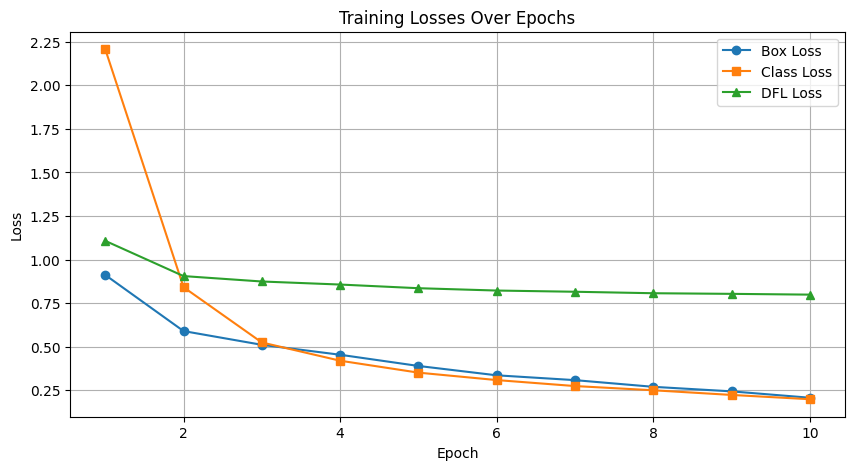

In [78]:
import matplotlib.pyplot as plt

# Ensure you use the correct column names from df.columns
plt.figure(figsize=(10, 5))
plt.plot(df["epoch"], df["train/box_loss"], label="Box Loss", marker="o")
plt.plot(df["epoch"], df["train/cls_loss"], label="Class Loss", marker="s")
plt.plot(df["epoch"], df["train/dfl_loss"], label="DFL Loss", marker="^")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses Over Epochs")
plt.legend()
plt.grid()
plt.show()

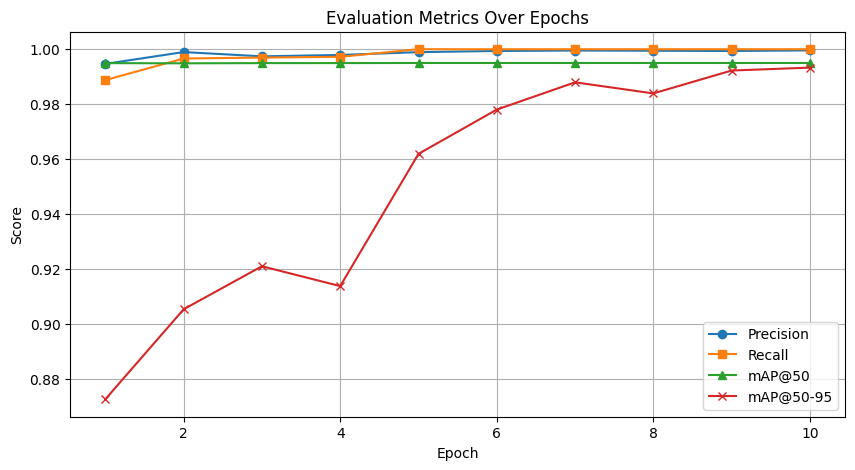

In [79]:
plt.figure(figsize=(10, 5))
plt.plot(df["epoch"], df["metrics/precision(B)"], label="Precision", marker="o")
plt.plot(df["epoch"], df["metrics/recall(B)"], label="Recall", marker="s")
plt.plot(df["epoch"], df["metrics/mAP50(B)"], label="mAP@50", marker="^")
plt.plot(df["epoch"], df["metrics/mAP50-95(B)"], label="mAP@50-95", marker="x")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Evaluation Metrics Over Epochs")
plt.legend()
plt.grid()
plt.show()